# Install libraries

In [ ]:
# check NVCC version
!nvcc -V

# check GCC version
!gcc --version

# check python in conda environtment
!which python

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2025 NVIDIA Corporation
Built on Fri_Feb_21_20:23:50_PST_2025
Cuda compilation tools, release 12.8, V12.8.93
Build cuda_12.8.r12.8/compiler.35583870_0
gcc (Ubuntu 11.4.0-1ubuntu1~22.04.2) 11.4.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

/usr/local/bin/python


In [ ]:
# install pytorch
!pip install torch

# install mmdet for inference demo
!pip install mmdet

# clone mmpose repo
!rm -rf mmpose
!git clone https://github.com/open-mmlab/mmpose.git
%cd mmpose

# install mmpose dependencies
!pip install -r requirements.txt

# install mmpose in develop mode
!pip install -e .

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 51.1 MB/s eta 0:00:00
Cloning into 'mmpose'...
remote: Enumerating objects: 31282, done.
remote: Counting objects: 100% (2/2), done.
remote: Total 31282 (delta 1), reused 1 (delta 1), pack-reused 31280 (from 2)
Receiving objects: 100% (31282/31282), 54.82 MiB | 29.12 MiB/s, done.
Resolving deltas: 100% (21525/21525), done.
/content/mmpose
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.6/50.6 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.1/254.1 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152

In [ ]:
!pip install mmcv==2.1.0 -f https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.htmly

Looking in links: https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.4/471.4 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.7/452.7 kB 35.4 MB/s eta 0:00:00


In [ ]:
# Check Pytorch installation
import torch, torchvision
print('torch version:', torch.__version__, torch.cuda.is_available())
print('torchvision version:', torchvision.__version__)

# Check MMPose installation
import mmpose
print('mmpose version:', mmpose.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print('cuda version:', get_compiling_cuda_version())
print('compiler information:', get_compiler_version())

import numpy as np

In [ ]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

# Chop the video

In [ ]:
import os
from glob import glob

import cv2


def make_folder(folder_path):
    if not os.path.isdir(folder_path):
        os.makedirs(folder_path)


def extract_images_from_videos(video_path, out_images_dir):
    video_fn = os.path.basename(video_path)[:-4]
    sub_images_dir = os.path.join(out_images_dir, video_fn)

    make_folder(sub_images_dir)

    video_cap = cv2.VideoCapture(video_path)
    n_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
    f_width = video_cap.get(cv2.CAP_PROP_FRAME_WIDTH)
    f_height = video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
    print('video_fn: {}.mp4, number of frames: {}, f_width: {}, f_height: {}'.format(video_fn, n_frames, f_width,
                                                                                     f_height))

    frame_cnt = -1
    while True:
        ret, img = video_cap.read()
        if ret:
            frame_cnt += 1
            image_path = os.path.join(sub_images_dir, 'img_{:06d}.jpg'.format(frame_cnt))
            if os.path.isfile(image_path):
                print('video {} had been already extracted'.format(video_path))
                break
            cv2.imwrite(image_path, img)
        else:
            break
        # if cv2.waitKey(10) & 0xFF == ord('q'):
        #     break
    video_cap.release()
    print('done extraction: {}'.format(video_path))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!ls "/content/drive/My Drive/Padel"

In [ ]:
 video_path = "/content/drive/My Drive/Padel/00_Fragment 1_20230528 PADEL VIGO  CLEAN.mp4"
 out_images_dir = "/content/images/"
 extract_images_from_videos(video_path, out_images_dir)

# Court detection

(1080, 1920, 3)


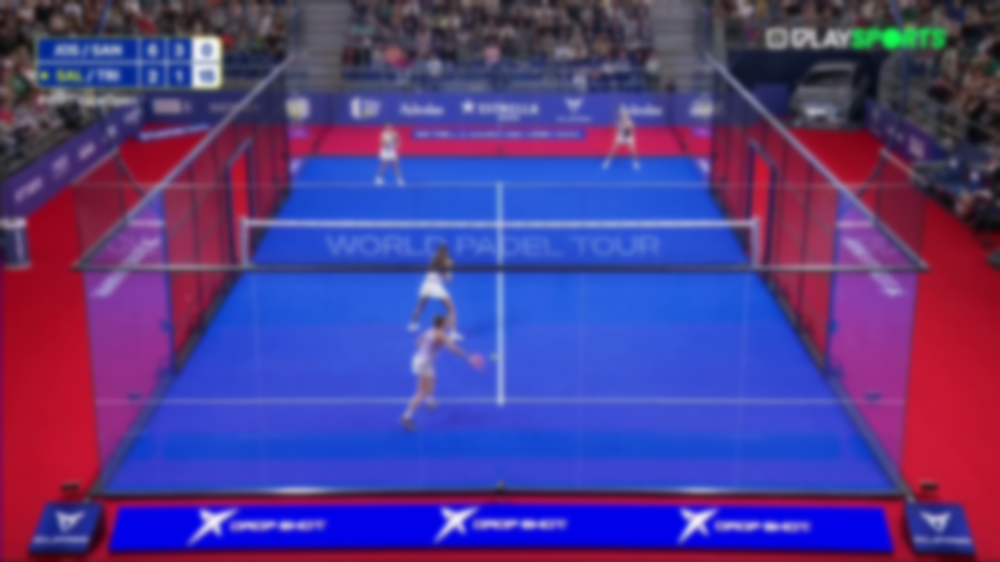

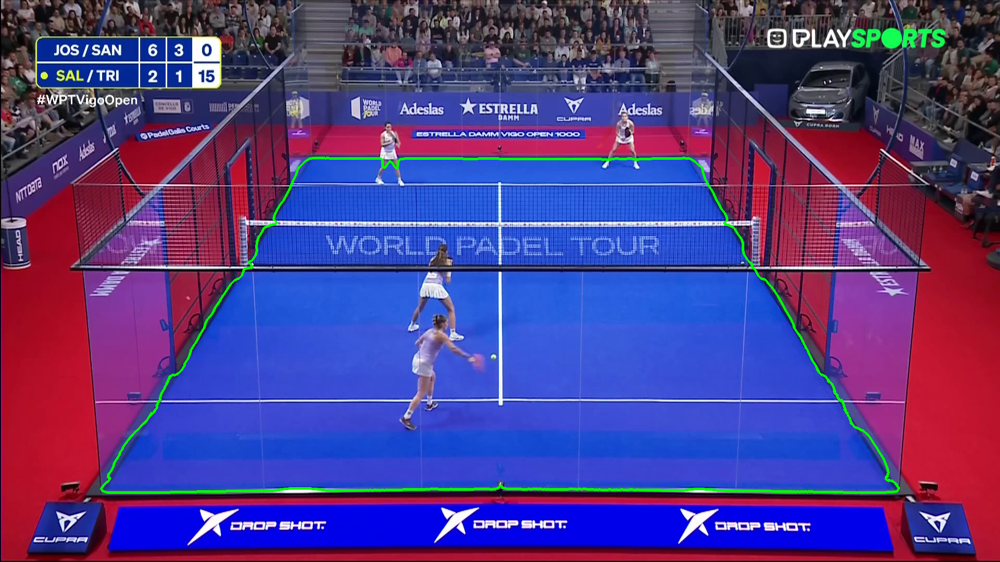

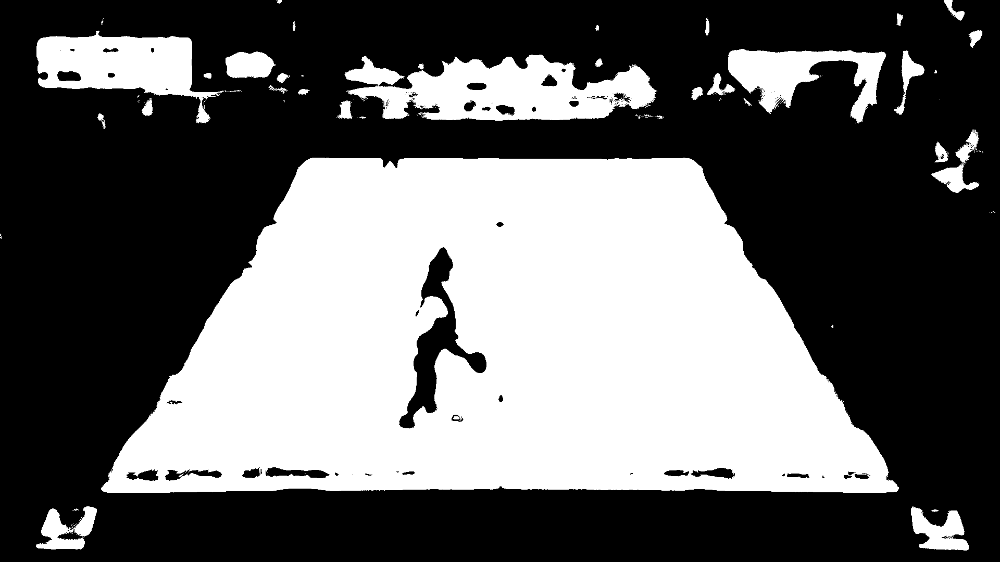

In [ ]:
# https://pysource.com/2018/03/01/find-and-draw-contours-opencv-3-4-with-python-3-tutorial-19/
#about blurring: https://www.pyimagesearch.com/2021/04/28/opencv-smoothing-and-blurring/

import cv2
import numpy as np
from google.colab.patches import cv2_imshow


image_path = "/content/images/00_Fragment 1_20230528 PADEL VIGO  CLEAN/img_000000.jpg"
image = cv2.imread(image_path)

blurred_frame = cv2.GaussianBlur(image, (35, 35), 0)
# blurred_frame = cv2.medianBlur(image, 35)
cv2_imshow(blurred_frame)
hsv = cv2.cvtColor(blurred_frame, cv2.COLOR_BGR2HSV)
lower_blue = np.array([100, 86, 0])
upper_blue = np.array([118, 255, 255])
mask = cv2.inRange(hsv, lower_blue, upper_blue)
# cv2_imshow(mask)

contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
max_contour = 0
max_area = 0
for contour in contours:
    area = cv2.contourArea(contour)
    if area > max_area:
      max_area = area
      max_contour = contour
cv2.drawContours(image, max_contour, -1, (0, 255, 0), 3)
cv2_imshow(image)
cv2_imshow(mask)

Printing corner: [[194 938]]


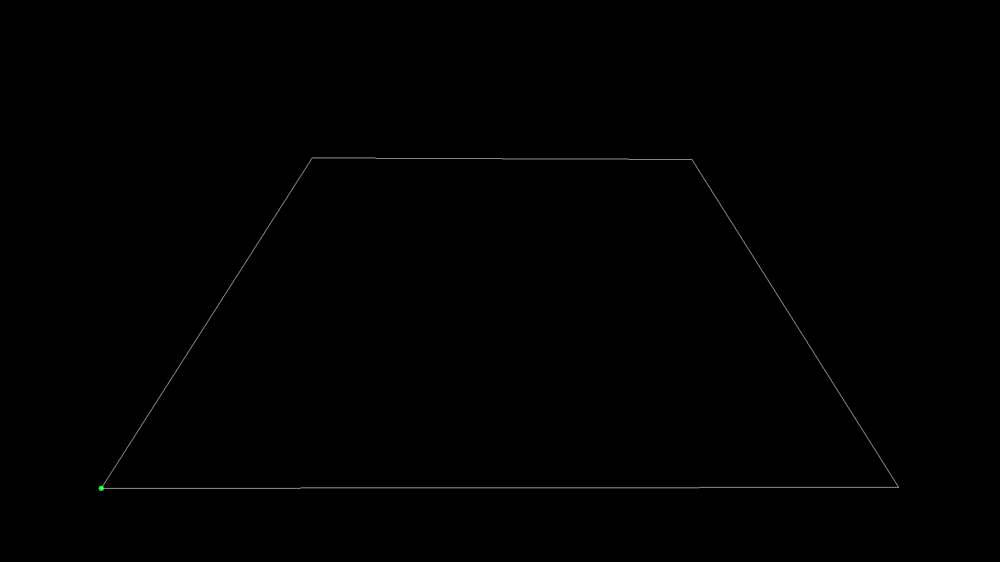

Printing corner: [[1725  936]]


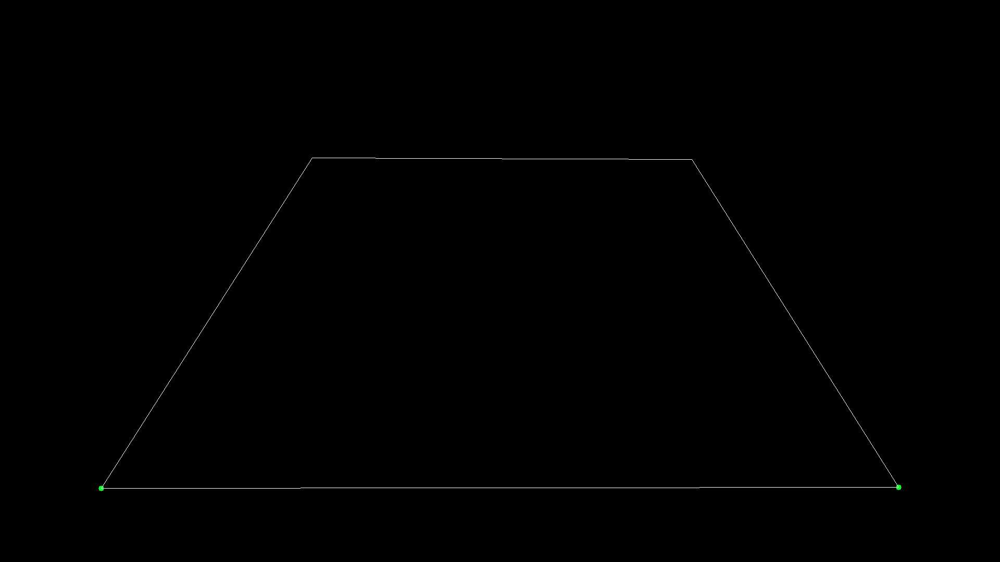

Printing corner: [[1328  306]]


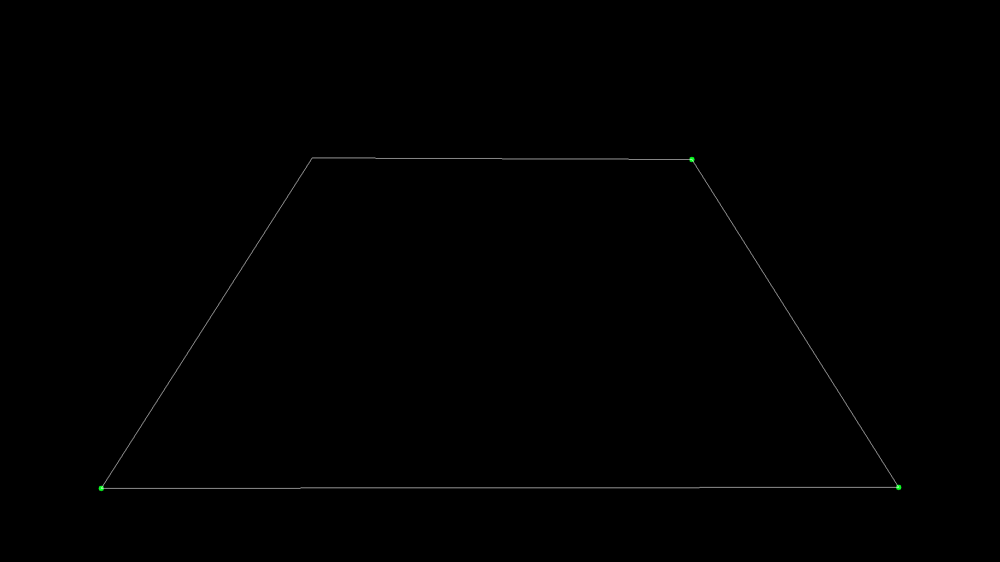

Printing corner: [[599 303]]


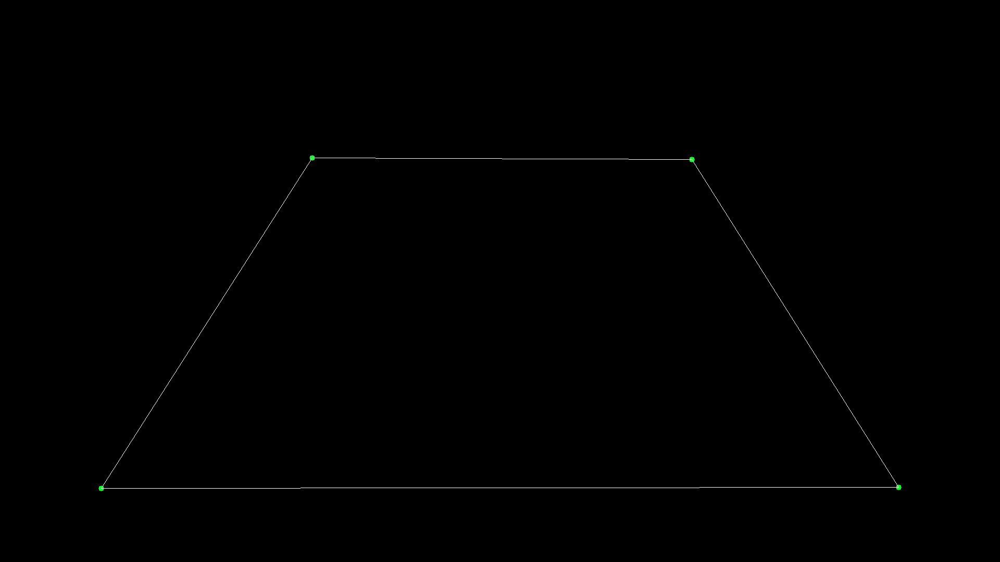

In [ ]:
mask = np.zeros(image.shape, np.uint8)
hh, ww = image.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
for corner in approx:
    print(f"Printing corner: {corner}")
    x,y = corner.ravel()
    cv2.circle(mask,(x,y),5,(36,255,12),-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
    cv2_imshow(mask)

# Homography

In [ ]:
court_dimensions = np.array(([0,20], [10, 20], [10,0], [0,0]), dtype=np.int32)
court_dimensions = court_dimensions + 1
background = np.array((25,15),dtype=np.int32)

In [ ]:
court_dimensions *= 40


In [ ]:
padding = np.amin(court_dimensions, axis=1)[0]
background = np.array((np.amax(court_dimensions, axis=1)[0] + padding ,np.amax(court_dimensions, axis=0)[0] + padding),dtype=np.int32)

In [ ]:
court_dimensions

array([[ 40, 840],
       [440, 840],
       [440,  40],
       [ 40,  40]], dtype=int32)

In [ ]:
approx

array([[[ 194,  938]],

       [[1725,  936]],

       [[1328,  306]],

       [[ 599,  303]]], dtype=int32)

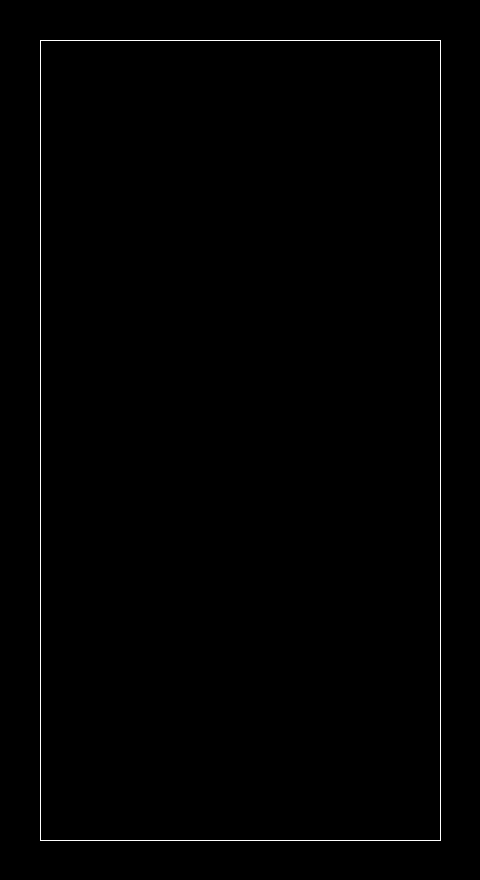

In [ ]:
court = np.zeros(background, np.int32)
cv2.drawContours(court, [court_dimensions], -1, (255,255,255),1)
cv2_imshow(court)

In [ ]:
h, status = cv2.findHomography(approx, court_dimensions)
h

array([[ 1.12226508e+00,  8.59880682e-01, -8.50143291e+02],
       [-2.38081032e-02,  5.61377777e+00, -1.60407627e+03],
       [-3.23940535e-05,  3.58197208e-03,  1.00000000e+00]])

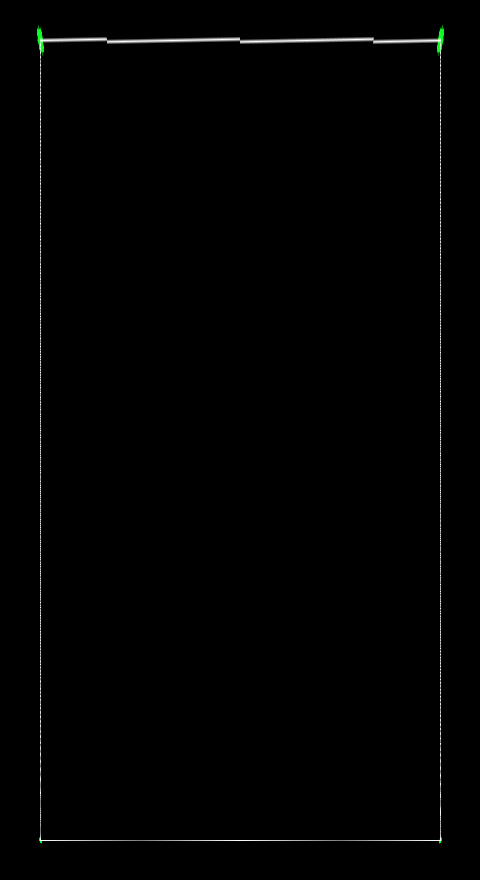

In [ ]:
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)

# MMPose

In [ ]:
import mmcv
from mmcv import imread
import mmengine
from mmengine.registry import init_default_scope
import numpy as np

from mmpose.apis import inference_topdown
from mmpose.apis import init_model as init_pose_estimator
from mmpose.evaluation.functional import nms
from mmpose.registry import VISUALIZERS
from mmpose.structures import merge_data_samples

try:
    from mmdet.apis import inference_detector, init_detector
    has_mmdet = True
except (ImportError, ModuleNotFoundError):
    has_mmdet = False

local_runtime = False

try:
    from google.colab.patches import cv2_imshow  # for image visualization in colab
except:
    local_runtime = True

pose_config = 'configs/body_2d_keypoint/topdown_heatmap/coco/td-hm_hrnet-w32_8xb64-210e_coco-256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w32_coco_256x192-c78dce93_20200708.pth'
det_config = 'demo/mmdetection_cfg/faster_rcnn_r50_fpn_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

if torch.cuda.is_available():
  device = 'cuda:0'
else:
  device = 'cpu'
cfg_options = dict(model=dict(test_cfg=dict(output_heatmaps=True)))


# build detector
detector = init_detector(
    det_config,
    det_checkpoint,
    device=device
)


# build pose estimator
pose_estimator = init_pose_estimator(
    pose_config,
    pose_checkpoint,
    device=device,
    cfg_options=cfg_options
)

# init visualizer
pose_estimator.cfg.visualizer.radius = 3
pose_estimator.cfg.visualizer.line_width = 1
visualizer = VISUALIZERS.build(pose_estimator.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_pose_estimator
visualizer.set_dataset_meta(pose_estimator.dataset_meta)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth


Downloading: "https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth" to /root/.cache/torch/hub/checkpoints/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth


Loads checkpoint by http backend from path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w32_coco_256x192-c78dce93_20200708.pth


Downloading: "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w32_coco_256x192-c78dce93_20200708.pth" to /root/.cache/torch/hub/checkpoints/hrnet_w32_coco_256x192-c78dce93_20200708.pth


In [ ]:
def get_pose_results(img_path, detector, pose_estimator):
  scope = detector.cfg.get('default_scope', 'mmdet')
  if scope is not None:
      init_default_scope(scope)
  detect_result = inference_detector(detector, img_path)
  pred_instance = detect_result.pred_instances.cpu().numpy()
  bboxes = np.concatenate(
      (pred_instance.bboxes, pred_instance.scores[:, None]), axis=1)
  bboxes = bboxes[np.logical_and(pred_instance.labels == 0,
                                  pred_instance.scores > 0.3)]
  bboxes = bboxes[nms(bboxes, 0.3)][:, :4]

  # predict keypoints
  pose_results = inference_topdown(pose_estimator, img_path, bboxes)
  return pose_results

In [ ]:
def visualize_img(img_path, pose_results, visualizer, show_interval, out_file):
    """Visualize predicted keypoints (and heatmaps) of one image."""
    data_samples = merge_data_samples(pose_results)

    # show the results
    img = mmcv.imread(img_path, channel_order='rgb')

    visualizer.add_datasample(
        'result',
        img,
        data_sample=data_samples,
        draw_gt=False,
        draw_heatmap=True,
        draw_bbox=True,
        show=False,
        wait_time=show_interval,
        out_file=out_file,
        kpt_thr=0.3)

## Detecting *only* the players

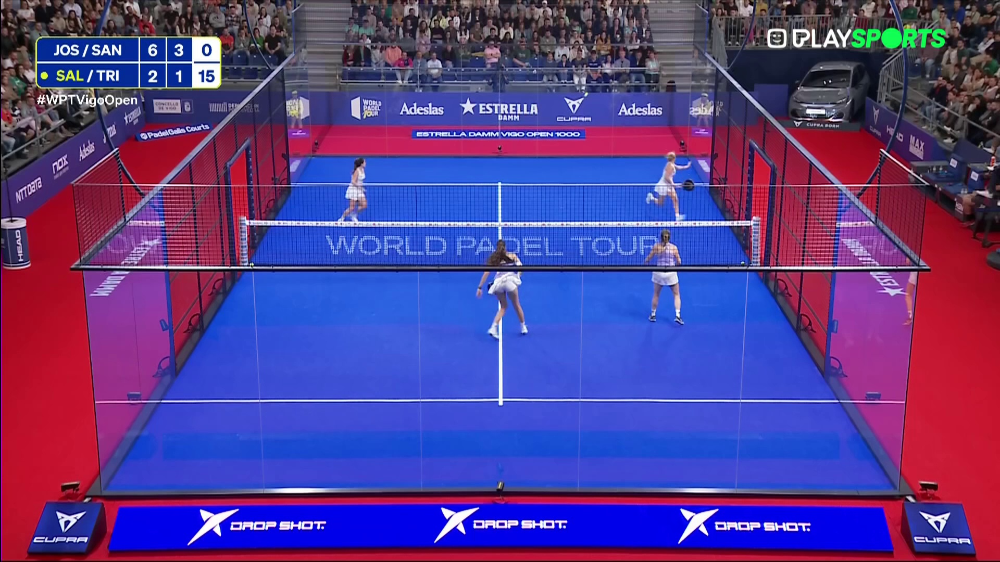

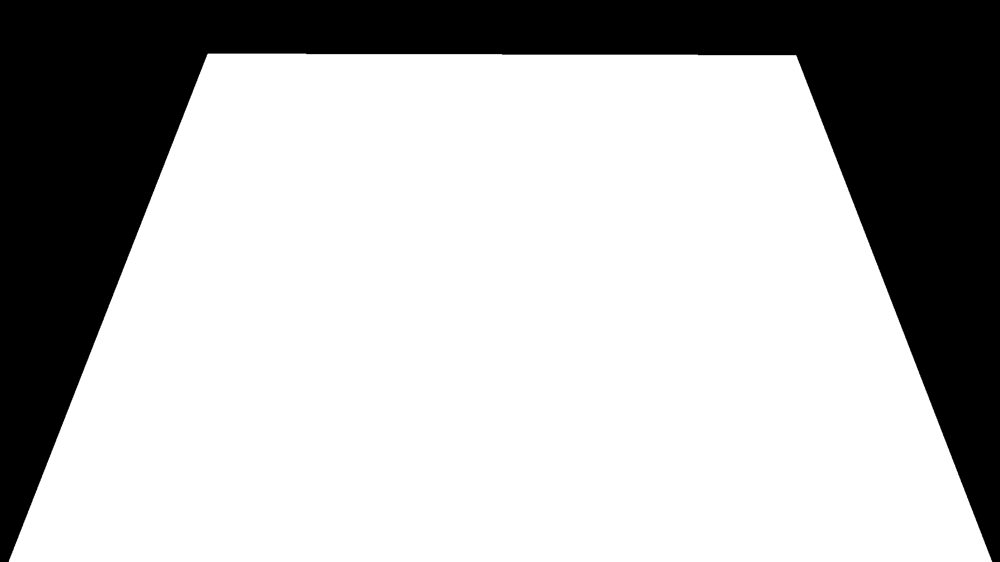

In [ ]:
image_path = "/content/images/00_Fragment 1_20230528 PADEL VIGO  CLEAN/img_000100.jpg"

img = cv2.imread(image_path)
cv2_imshow(img)
mask = np.zeros(img.shape[:2], np.uint8)
mask_contour = np.array(approx)
padding = 200
mask_contour[:,:,0][mask_contour[:,:,0]>1000] += padding
mask_contour[:,:,0][mask_contour[:,:,0]<1000] -= padding
mask_contour[:,:,1][mask_contour[:,:,1]>500] += padding
mask_contour[:,:,1][mask_contour[:,:,1]<500] -= padding

cv2.drawContours(mask, [mask_contour], -1, (255,255,255), -1)
cv2_imshow(mask)

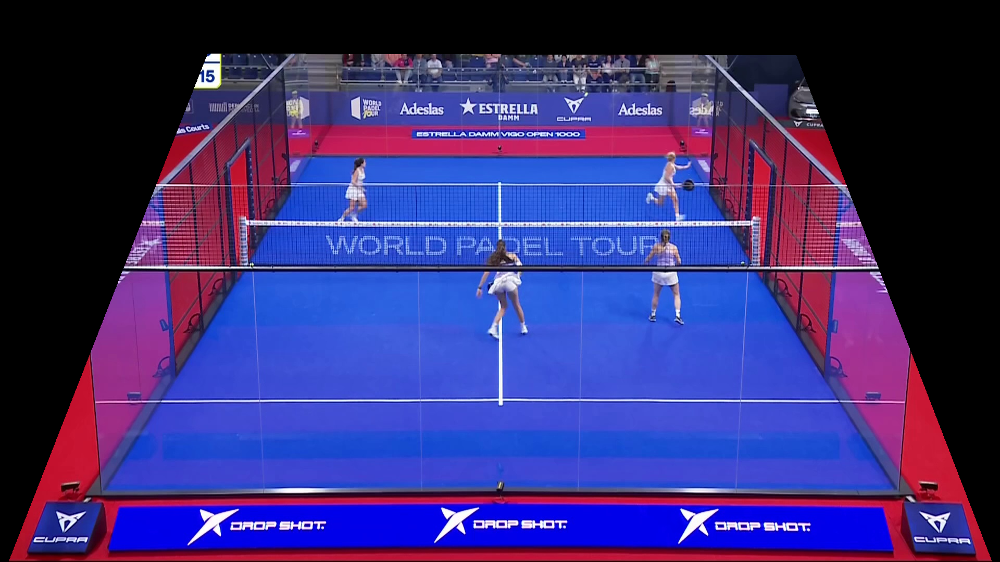

In [ ]:
image_court = img.copy()
image_court[mask == 0, :] = (0, 0, 0)
cv2_imshow(image_court)

In [ ]:
pose_results = get_pose_results(image_court, detector, pose_estimator)
visualize_img(
    image_court,
    pose_results,
    visualizer,
    show_interval=0,
    out_file=None)

vis_result = visualizer.get_image()

02/07 10:30:13 - mmengine - WARNING - The current default scope "mmpose" is not "mmdet", `init_default_scope` will force set the currentdefault scope to "mmdet".
02/07 10:30:15 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".


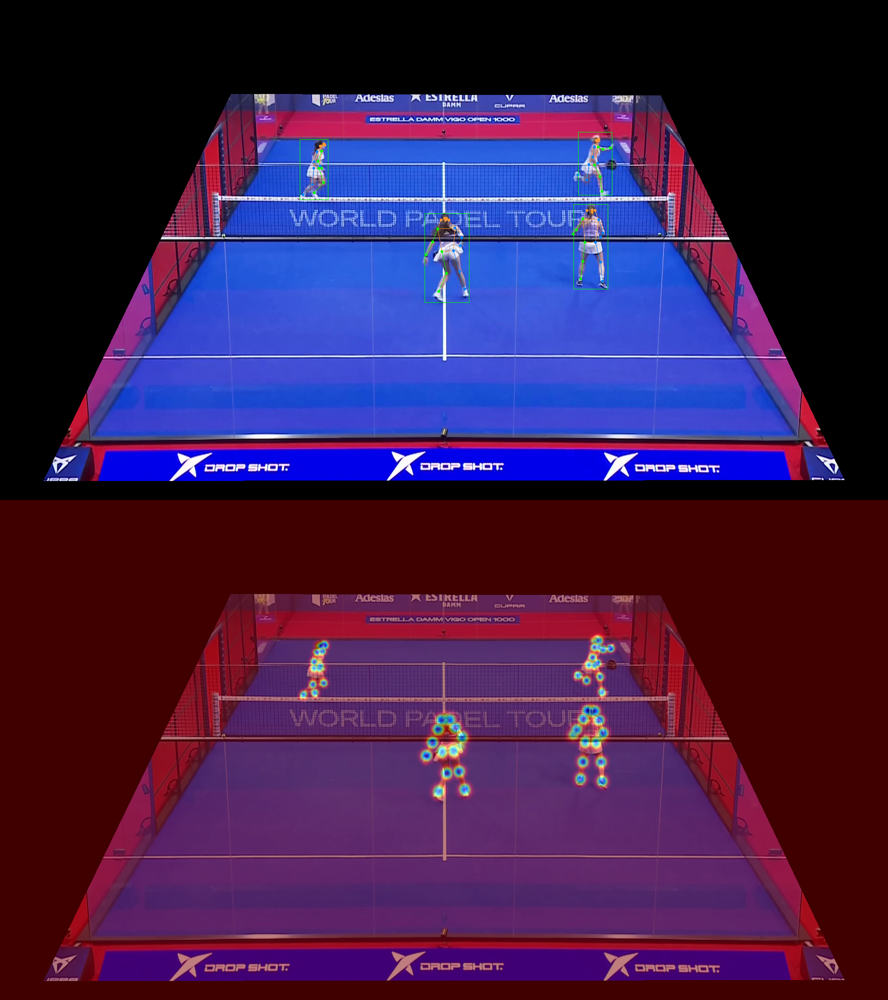

In [ ]:
if local_runtime:
    from IPython.display import Image, display
    import tempfile
    import os.path as osp
    import cv2
    with tempfile.TemporaryDirectory() as tmpdir:
        file_name = osp.join(tmpdir, 'pose_results.png')
        cv2.imwrite(file_name, vis_result[:,:,::-1])
        display(Image(file_name))
else:
    cv2_imshow(vis_result)

COCO Output Format Nose – 0, Neck – 1, Right Shoulder – 2, Right Elbow – 3, Right Wrist – 4, Left Shoulder – 5, Left Elbow – 6,
 Left Wrist – 7, Right Hip – 8, Right Knee – 9, Right Ankle – 10, Left Hip – 11, Left Knee – 12, LAnkle – 13, Right Eye – 14,
  Left Eye – 15, Right Ear – 16, Left Ear – 17, Background – 18

  This is the COCO keypoints definitions according to some site I lost, but in this library the keypoints are nothing like this.
  In fact, our keypoints of interest are:
  left_hip = 11
  right_hip = 12
  left_foot = 15
  right_foot = 16

In [ ]:
# Correction factor
CORRECTION_FACTOR = 15.0

In [ ]:
players = []
for result in pose_results:
  left_hip = result.pred_instances.keypoints[0][11]
  right_hip = result.pred_instances.keypoints[0][12]
  # We compute the mean of left and right hips to get the "central" hip point.
  hip = ((left_hip[0] + right_hip[0])/2, (left_hip[1] + right_hip[1])/2)
  left_foot = (result.pred_instances.keypoints[0][15][0], result.pred_instances.keypoints[0][15][1] + CORRECTION_FACTOR)
  right_foot = (result.pred_instances.keypoints[0][16][0], result.pred_instances.keypoints[0][16][1] + CORRECTION_FACTOR)
  players.append((hip, left_foot, right_foot))

In [ ]:
player_0 = []
player_1 = []
player_2 = []
player_3 = []

# Compute the player position projected on the court plane.
def getPosition(keypoints):
  hip, left_foot, right_foot = keypoints
  return (hip[0], (left_foot[1]+right_foot[1])/2)

player_0.append(getPosition(players[0]))
player_1.append(getPosition(players[1]))
player_2.append(getPosition(players[2]))
player_3.append(getPosition(players[3]))

playerPositions = [player_0, player_1, player_2, player_3]

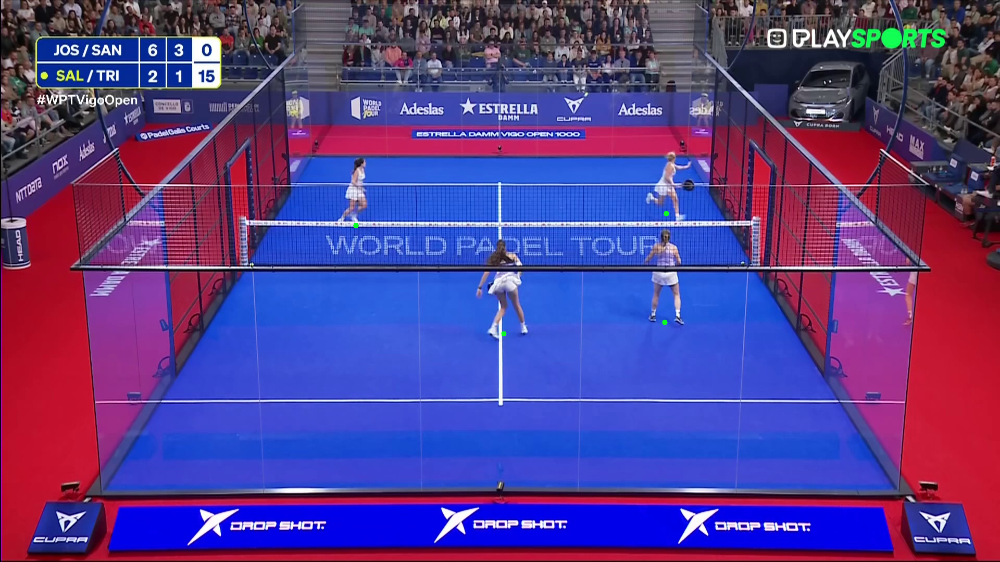

In [ ]:
img = cv2.imread(image_path)

for pos in playerPositions:
  x, y = pos[0]
  cv2.circle(img,(int(x),int(y)),5,(36,255,12),-1)
cv2_imshow(img)

Printing pos: [(967.953857421875, 641.9383850097656)]
Printing pos: [(1276.13232421875, 619.8775634765625)]
Printing pos: [(683.9603271484375, 433.30328369140625)]
Printing pos: [(1279.4376220703125, 410.8308563232422)]


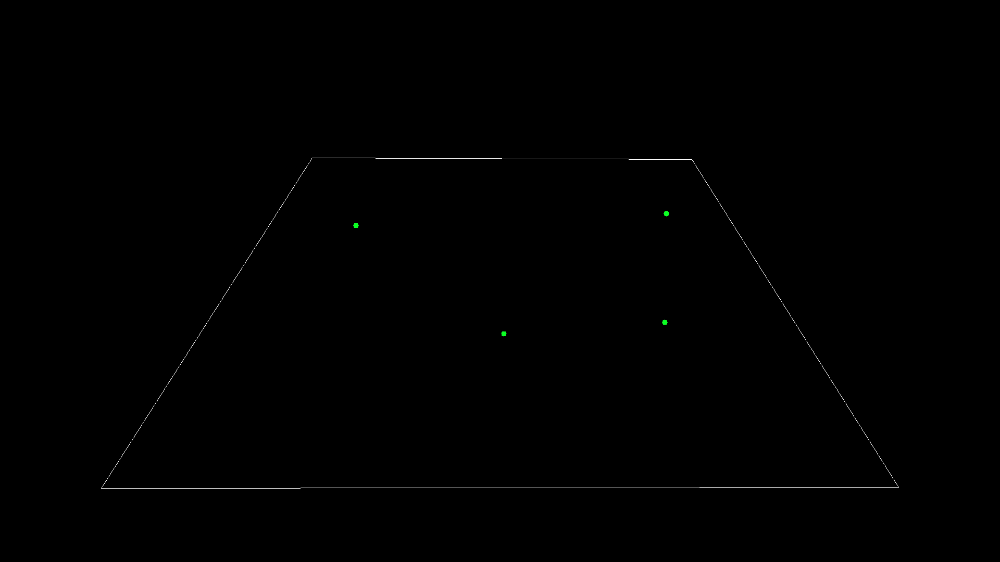

In [ ]:
# Represent the player positions in the court plane.

img = cv2.imread(image_path)
mask = np.zeros(img.shape, np.uint8)
hh, ww = img.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
for pos in playerPositions:
    print(f"Printing pos: {pos}")
    x,y = pos[0][0], pos[0][1]
    cv2.circle(mask,(int(x),int(y)),5,(36,255,12),-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
cv2_imshow(mask)

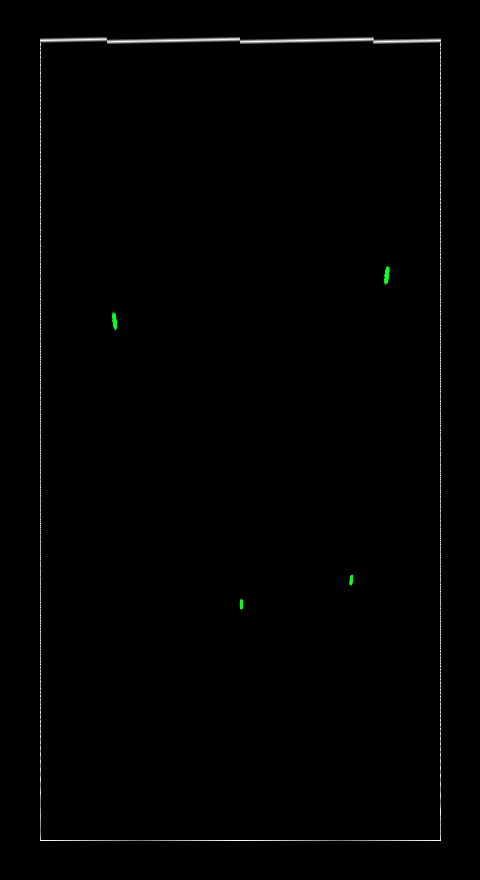

In [ ]:
# Translate the player positions to the zenithal court plane
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)

## Process video

In [ ]:
def assign_new_positions(players_positions, pos, frame_count):
  distances = []
  for idx, ppos in enumerate(players_positions):
      if len(ppos) == 0:
          players_positions[idx].append(pos)
          return players_positions
      # Compute the distance between the last measurment and the new one
      if len(ppos) > frame_count:
        distances.append(np.inf)
      else:
        distances.append(np.linalg.norm(np.array(ppos[-1])-np.array(pos)))

  players_positions[np.argmin(distances)].append(pos)
  return players_positions

In [ ]:
import os
from IPython.display import display, clear_output

base_img = cv2.imread(image_path)
hh, ww = base_img.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
colors = [(250,0, 255),(255,0,0), (0,0,255), (0,255,0)]

pose_config = 'configs/body_2d_keypoint/topdown_heatmap/coco/td-hm_hrnet-w32_8xb64-210e_coco-256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w32_coco_256x192-c78dce93_20200708.pth'
det_config = 'demo/mmdetection_cfg/faster_rcnn_r50_fpn_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

cfg_options = dict(model=dict(test_cfg=dict(output_heatmaps=True, flip_test=False)))

# build detector
detector = init_detector(
    det_config,
    det_checkpoint,
    device=device
)


# build pose estimator
pose_estimator = init_pose_estimator(
    pose_config,
    pose_checkpoint,
    device=device,
    cfg_options=cfg_options
)

# init visualizer
pose_estimator.cfg.visualizer.radius = 3
pose_estimator.cfg.visualizer.line_width = 1
visualizer = VISUALIZERS.build(pose_estimator.cfg.visualizer)
# the dataset_meta is loaded from the checkpoint and
# then pass to the model in init_pose_estimator
visualizer.set_dataset_meta(pose_estimator.dataset_meta)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w32_coco_256x192-c78dce93_20200708.pth


/usr/local/lib/python3.10/dist-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmpose.visualization.local_visualizer.PoseLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


In [ ]:
cap = cv2.VideoCapture(video_path)
assert cap.isOpened(), f'Faild to load video file {"/content/padel-final.mp4"}'

os.makedirs("/content/video/", exist_ok=True)
save_out_video = True

if save_out_video:
    fps = cap.get(cv2.CAP_PROP_FPS)
    size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
            int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    videoWriter = cv2.VideoWriter(
        os.path.join("/content/video/",
                      f'vis_{os.path.basename("/content/padel.mp4")}'), fourcc,
        fps, size)
# e.g. use ('backbone', ) to return backbone feature
output_layer_names = None

# Get the frames per second (fps) of the video
fps = cap.get(cv2.CAP_PROP_FPS)

# Calculate the number of frames to skip
frames_to_skip = 0

print("FPS: ", fps, " - frames to skip: ", frames_to_skip)

FPS:  25.0  - frames to skip:  0


In [ ]:
def draw_points(frame, players_positions):
  colors = [(250,0, 255),(255,0,0), (0,0,255), (0,255,0)]
  for idx,player in enumerate(players_positions):
      for pos in player:
          x,y = pos[0], pos[1]
          cv2.circle(frame,(int(x),int(y)),5,colors[idx],-1)
  return frame

In [ ]:
players_positions = [[] for _ in range(4)]
frame_count = 0
while (cap.isOpened()):
    flag, img = cap.read()
    if not flag:
        break
    # test a single image, the resulting box is (x1, y1, x2, y2)

    mask = np.zeros(img.shape[:2], np.uint8)
    mask_contour = np.array(approx)
    padding = 100
    mask_contour[:,:,0][mask_contour[:,:,0]>1000] += padding
    mask_contour[:,:,0][mask_contour[:,:,0]<1000] -= padding
    mask_contour[:,:,1][mask_contour[:,:,1]>500] += padding
    mask_contour[:,:,1][mask_contour[:,:,1]<500] -= padding

    cv2.drawContours(mask, [mask_contour], -1, (255,255,255), -1)

    image_court = img.copy()
    image_court[mask == 0, :] = (0, 0, 0)

    pose_results = get_pose_results(image_court, detector, pose_estimator)

    if len(pose_results) <= 4:
      for result in pose_results:
        left_hip = result.pred_instances.keypoints[0][11]
        right_hip = result.pred_instances.keypoints[0][12]

        # We compute the mean of left and right hips to get the "central" hip point.
        hip = ((left_hip[0] + right_hip[0])/2, (left_hip[1] + right_hip[1])/2)
        left_foot = (result.pred_instances.keypoints[0][15][0], result.pred_instances.keypoints[0][15][1] + CORRECTION_FACTOR)
        right_foot = (result.pred_instances.keypoints[0][16][0], result.pred_instances.keypoints[0][16][1] + CORRECTION_FACTOR)
        foot = (left_foot[1]+right_foot[1])/2

        players_positions = assign_new_positions(players_positions, (hip[0], foot), frame_count)

    # mask = np.zeros(base_img.shape, np.uint8)
    # for idx,player in enumerate(players_positions):
    #   for pos in player:
    #       x,y = pos[0], pos[1]
    #       cv2.circle(mask,(int(x),int(y)),5,colors[idx],-1)
    #   cv2.drawContours(mask, [approx], -1, (255,255,255),1)
    # clear_output(wait=True)
    # cv2_imshow(mask)

    # Filter detections and draw bounding boxes
    frame_with_points = draw_points(img, players_positions)

    if save_out_video:
        videoWriter.write(frame_with_points)
    frame_count += 1

    # Skip 'frames_to_skip' frames
    for _ in range(frames_to_skip):
        ret, _ = cap.read()
        if not ret:
            break

cap.release()
if save_out_video:
    videoWriter.release()

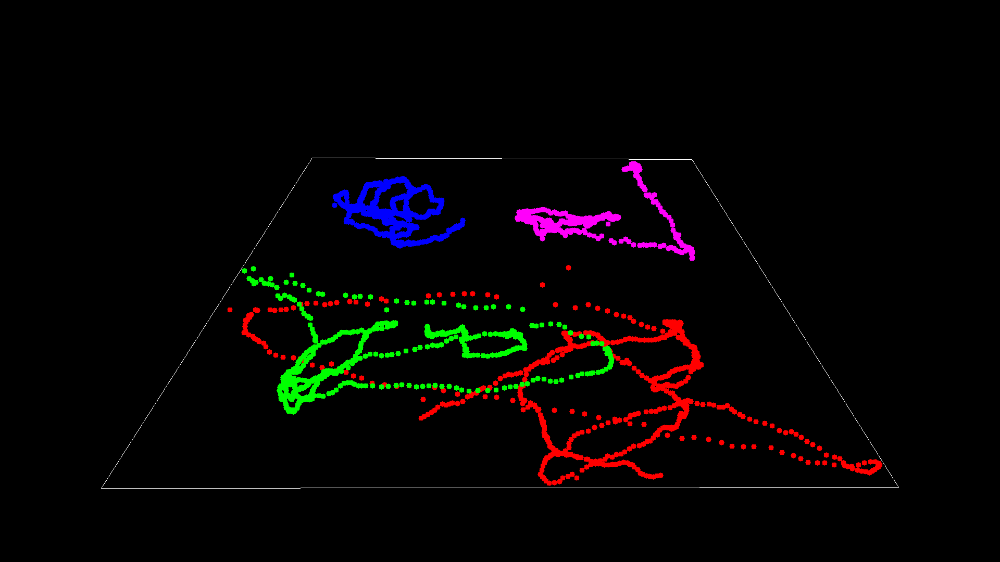

In [ ]:
img = cv2.imread(image_path)
mask = np.zeros(img.shape, np.uint8)
hh, ww = img.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
colors = [(250,0, 255),(255,0,0), (0,0,255), (0,255,0)]
for idx,player in enumerate(players_positions):
    for pos in player:
        x,y = pos[0], pos[1]
        cv2.circle(mask,(int(x),int(y)),5,colors[idx],-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
cv2_imshow(mask)

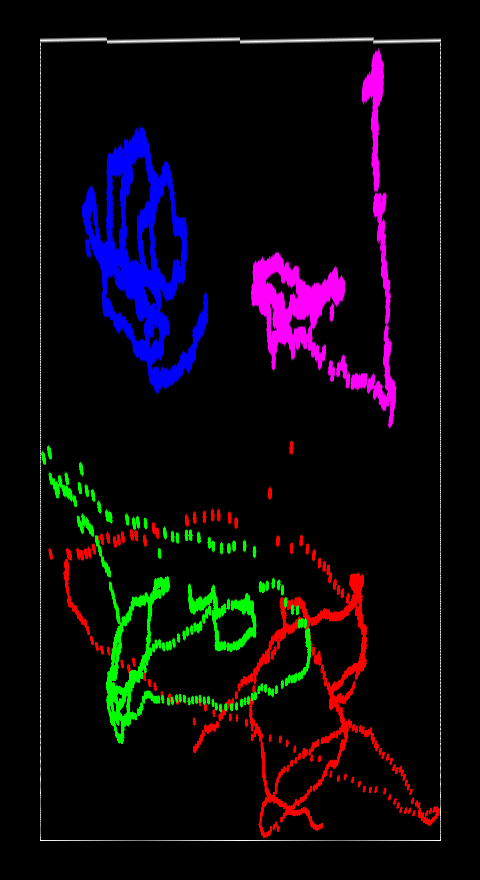

In [ ]:
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)